In [1]:
import pandas as pd, plotly.express as px, seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

scalers = {
    "standard": StandardScaler(),
    "minmax": MinMaxScaler(),
    "robust": RobustScaler()
}
df_base = pd.read_csv("Baseline_16-7-25_Readings.csv")
df_apple = pd.read_csv("Apple_Readings.csv")
df_orange = pd.read_csv("Orange_Readings.csv")

In [2]:
# drop any column that ends in "- V" 
df_base = df_base.loc[:, ~df_base.columns.str.endswith(" - V")]
df_apple = df_apple.loc[:, ~df_apple.columns.str.endswith(" - V")]
df_orange = df_orange.loc[:, ~df_orange.columns.str.endswith(" - V")]

# each row if there is non numeric data, replace it with the number before the unit
def clean_numeric_data(df):
    for col in df.columns:
        if df[col].dtype == 'object':
            df[col] = pd.to_numeric(df[col].str.extract(r'(\d+\.?\d*)')[0], errors='coerce')
    return df

df_base = clean_numeric_data(df_base)
df_apple = clean_numeric_data(df_apple)
df_orange = clean_numeric_data(df_orange)

In [3]:
df_base["Label"] = "Baseline"
df_apple["Label"] = "Apple"
df_orange["Label"] = "Orange"
df = pd.concat([df_base, df_apple, df_orange], ignore_index=True)

In [9]:
df

,Timestamp,Flowrate (L/min),B2 - BME680 - temperature - °C,B2 - BME680 - pressure - KPa,B2 - BME680 - humidity - %,B2 - BME680 - gas - Kohms,B2 - SGP41 - SRAW_VOC - raw,B2 - SGP41 - SRAW_NOx - raw,B1 - Multichannel Gas Sensor - GM102B (NO2) - ppm,B1 - Multichannel Gas Sensor - GM302B (C2H5CH) - ppm,...,B1 - SGP30 - tVOC - ppb,B1 - SGP30 - CO2eq - ppm,B1 - BME688 - temperature - °C,B1 - BME688 - pressure - KPa,B1 - BME688 - humidity - %,B1 - BME688 - gas - Kohms,B1 - Formaldehyde - hcho - ppb,B1 - Formaldehyde - humidity - %,B1 - Formaldehyde - temperature - °C,Label
0,16,5.0,22.46,94.76,29.08,0.00,31925,0,251,359,...,283,801,25.06,94.77,36.02,12946.86,11.0,25.36,24.07,Baseline
1,16,5.0,22.48,94.76,29.10,90.71,31955,0,251,359,...,301,799,25.06,94.77,36.01,12946.86,11.2,25.35,24.08,Baseline
2,16,5.0,22.50,94.76,29.12,88.88,31979,0,252,359,...,287,797,25.06,94.77,36.01,12946.86,11.2,25.34,24.05,Baseline
3,16,5.0,22.51,94.76,29.12,90.12,31974,0,252,359,...,286,801,25.06,94.78,35.99,12946.86,11.0,25.34,24.07,Baseline
4,16,5.0,22.52,94.76,29.12,91.20,31994,0,252,359,...,290,801,25.06,94.77,35.98,12946.86,11.0,25.33,24.06,Baseline
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
955,17,2.0,24.53,94.68,29.66,75.09,30808,0,247,438,...,89,437,26.61,94.69,37.99,12946.86,45.0,26.67,25.87,Orange
956,17,2.0,24.56,94.68,29.52,75.84,30883,0,247,439,...,83,422,26.61,94.69,37.97,12946.86,45.0,26.66,25.86,Orange
957,17,2.0,24.55,94.67,29.51,75.84,30869,0,247,438,...,85,428,26.62,94.69,37.98,12946.86,45.0,26.68,25.88,Orange
958,17,2.0,24.55,94.67,29.50,75.98,30887,0,246,438,...,86,431,26.62,94.69,37.99,12946.86,45.0,26.66,25.87,Orange


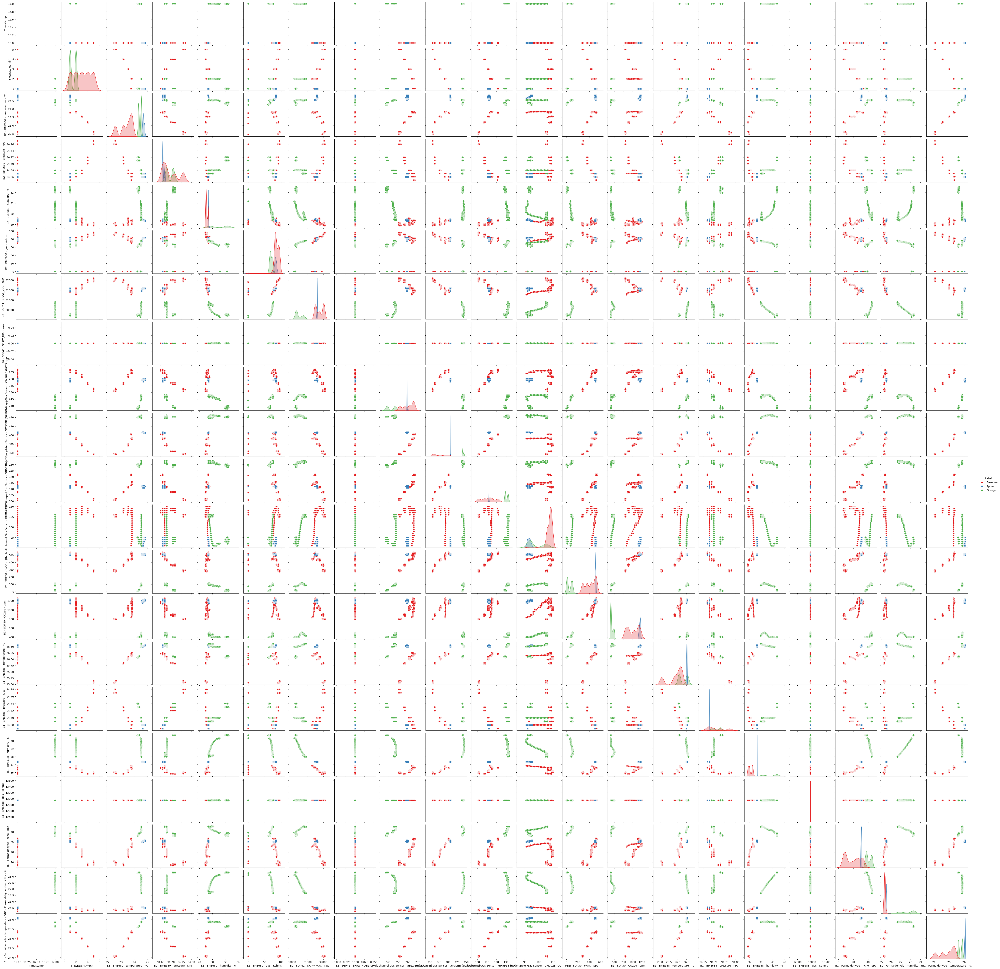

In [4]:
sns.pairplot(df, hue="Label", palette="Set1", markers=["o", "s", "D"], diag_kind="kde")

In [5]:
df_minmax = df.copy()
df_standard = df.copy()
df_robust = df.copy()

df_minmax.iloc[:, :-1] = scalers["minmax"].fit_transform(df_minmax.iloc[:, :-1])
df_standard.iloc[:, :-1] = scalers["standard"].fit_transform(df_standard.iloc[:, :-1])
df_robust.iloc[:, :-1] = scalers["robust"].fit_transform(df_robust.iloc[:, :-1])

/var/folders/4s/mx73b76x0rz965pt1wpmkwyw0000gn/T/ipykernel_1058/876578403.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.90715373 0.92237443 0.93455099 0.93201421 0.94216134 0.9426687
 0.95281583 0.95890411 0.95636733 0.95636733 0.95180112 0.96803653
 0.96347032 0.96144089 0.95991882 0.96245561 0.96397768 0.95636733
 0.96245561 0.96854389 0.96296296 0.95941147 0.96397768 0.96144089
 0.96651446 0.95687468 0.96448503 0.97006596 0.96752917 0.96752917
 0.96803653 0.96397768 0.96702182 0.9731101  0.96905124 0.97615424
 0.97006596 0.96752917 0.96803653 0.96093354 0.96702182 0.97006596
 0.97919838 0.96752917 0.98427194 0.96499239 0.97006596 0.95839675
 0.97564688 0.96854389 0.96752917 0.97260274 0.95991882 0.96752917
 0.96905124 0.96905124 0.9660071  0.96448503 0.9731101  0.9660071
 0.97513952 0.97260274 0.95585997 0.97513952 0.97006596 0.97108067
 0.96702182 0.96702182 0.96905124 0.97818366 0.96093354 0.97057331


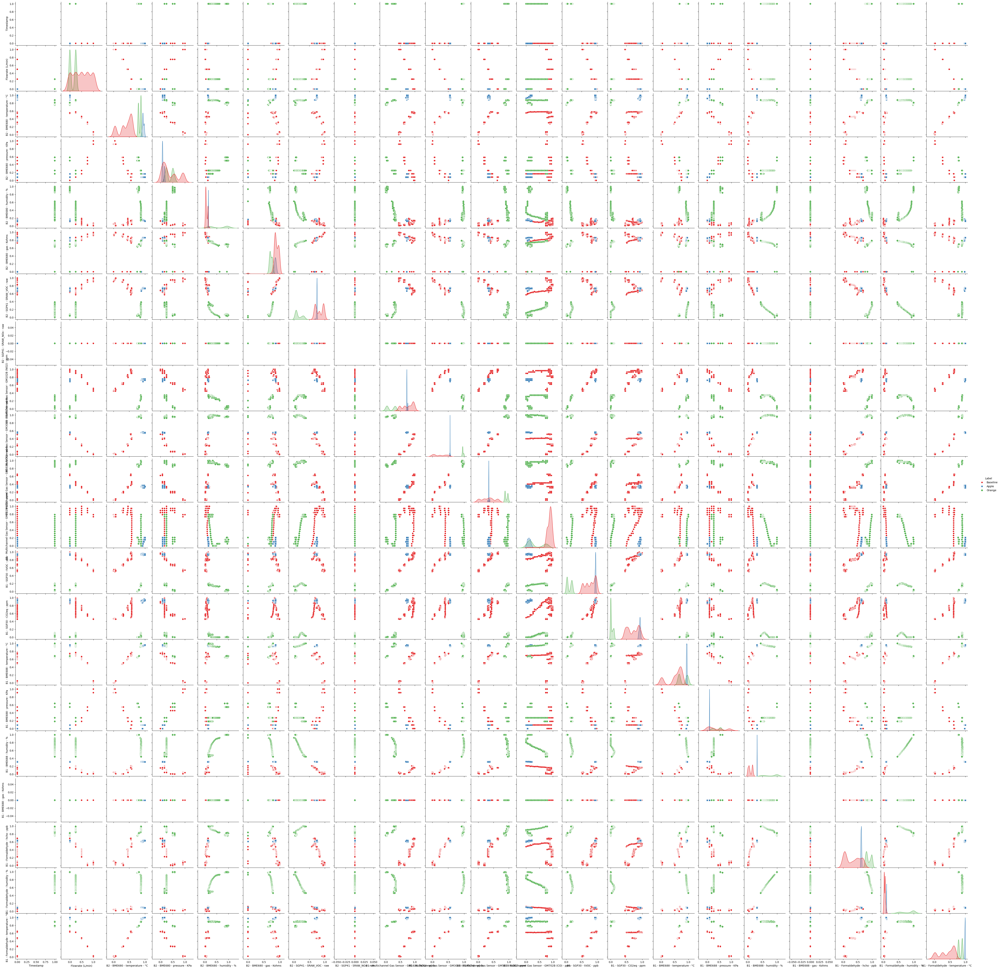

In [10]:
sns.pairplot(df_minmax, hue="Label", palette="Set1", markers=["o", "s", "D"], diag_kind="kde")

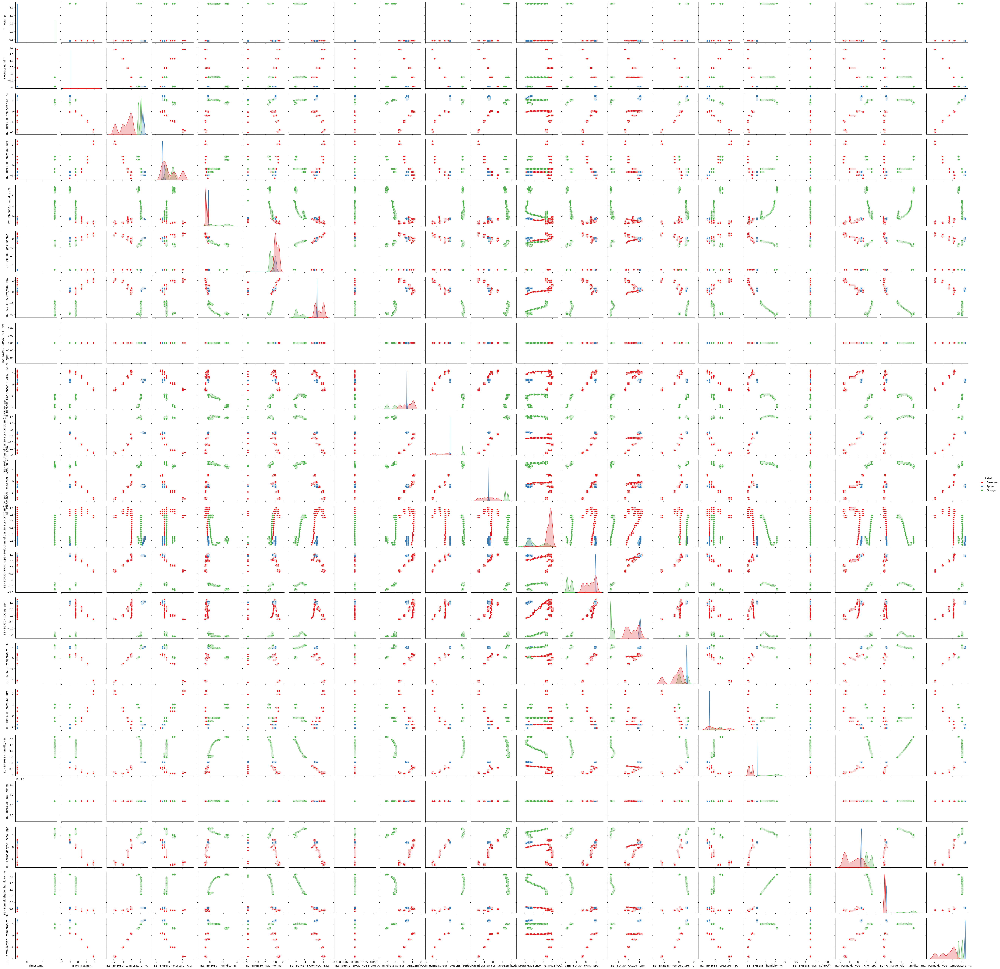

In [11]:
sns.pairplot(df_standard, hue="Label", palette="Set1", markers=["o", "s", "D"], diag_kind="kde")

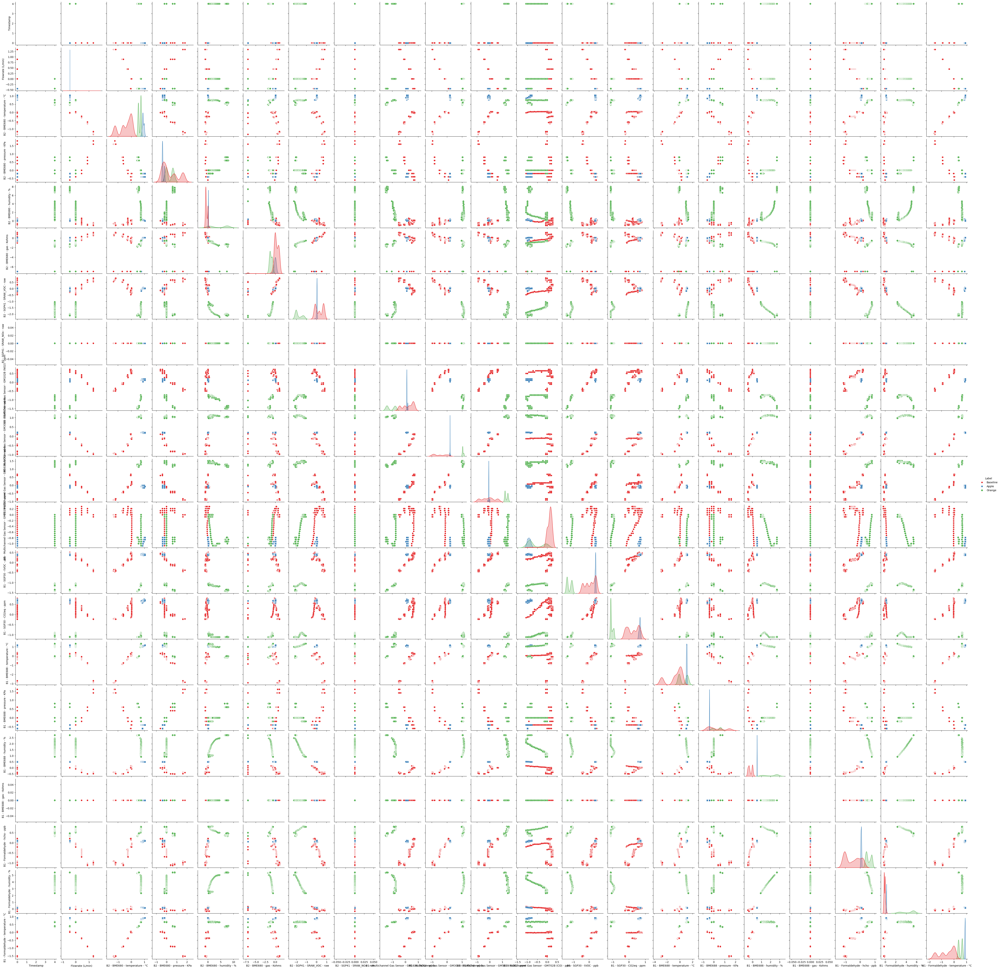

In [12]:
sns.pairplot(df_robust, hue="Label", palette="Set1", markers=["o", "s", "D"], diag_kind="kde")